## HCP individualized connectome model training

In [67]:
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt
import scipy
import sklearn
from sklearn.decomposition import PCA
import torch
from torch.utils.data import Dataset, DataLoader
from data.data_utils import *


In [68]:
import importlib
import loss
from loss import *
import data.hcp_dataset
import data.dataset_utils 
import data.data_utils
importlib.reload(data.hcp_dataset)
importlib.reload(data.dataset_utils)
importlib.reload(data.data_utils)
from data.hcp_dataset import *
from data.dataset_utils import *
from data.data_utils import *
from data.hcp_dataset import HCP_Base, HCP_Partition

In [69]:
import models
from models import *
from models import CrossModalPCA, CrossModal_PCA_PLS
importlib.reload(models)
from models import *

import importlib
import eval
importlib.reload(eval)
from eval import *

importlib.reload(eval)
import eval
from eval import *

importlib.reload(data.hcp_dataset)
importlib.reload(data.dataset_utils)
importlib.reload(data.data_utils)
import data

importlib.reload(loss)
from loss import *


### Cross-modal (SC-to-FC) PCA + PLS Fusion model

In [4]:
HCP_Dataset = HCP_Base(parcellation="Glasser", shuffle_seed=0, source="SC", target="FC")

# redefine dataset and loaders
HCP_train = HCP_Partition(HCP_Dataset, "train")
HCP_val = HCP_Partition(HCP_Dataset, "val")
HCP_test = HCP_Partition(HCP_Dataset, "test")
HCP_train_loader = DataLoader(HCP_train, batch_size=256, shuffle=False)
HCP_val_loader = DataLoader(HCP_val, batch_size=256, shuffle=False)
HCP_test_loader = DataLoader(HCP_test, batch_size=256, shuffle=False)

In [62]:
# initialize model
cross_modal_pca_pls_model = CrossModal_PCA_PLS(HCP_Dataset, n_components_pca=256, n_components_pls=128)

# generate predictions
device = cross_modal_pca_pls_model.device if hasattr(cross_modal_pca_pls_model, 'device') else torch.device("cpu")
train_preds, train_targets = predict_from_loader(cross_modal_pca_pls_model, HCP_train_loader, device=device)
val_preds, val_targets = predict_from_loader(cross_modal_pca_pls_model, HCP_val_loader, device=device)
test_preds, test_targets = predict_from_loader(cross_modal_pca_pls_model, HCP_test_loader, device=device)


/ext3/miniforge3/lib/python3.12/site-packages/sklearn/cross_decomposition/_pls.py:104: ConvergenceWarning: Maximum number of iterations reached
  warnings.warn("Maximum number of iterations reached", ConvergenceWarning)


PLS model fit score:  0.34674218292821457
PCA source scores shape: torch.Size([683, 683])
PLS source scores shape:  (683, 128)
PLS target scores shape:  (683, 128)
PCA target scores shape: torch.Size([683, 683])


In [63]:
train_evaluator = Evaluator(train_preds, train_targets, HCP_train, HCP_Dataset)
val_evaluator = Evaluator(val_preds, val_targets, HCP_val, HCP_Dataset)
test_evaluator = Evaluator(test_preds, test_targets, HCP_test, HCP_Dataset)

Top-1 accuracy: 0.031  (6 of 195 subjects had rank 1) (chance=0.005)
Average rank percentile: 0.708 (chance=0.5)


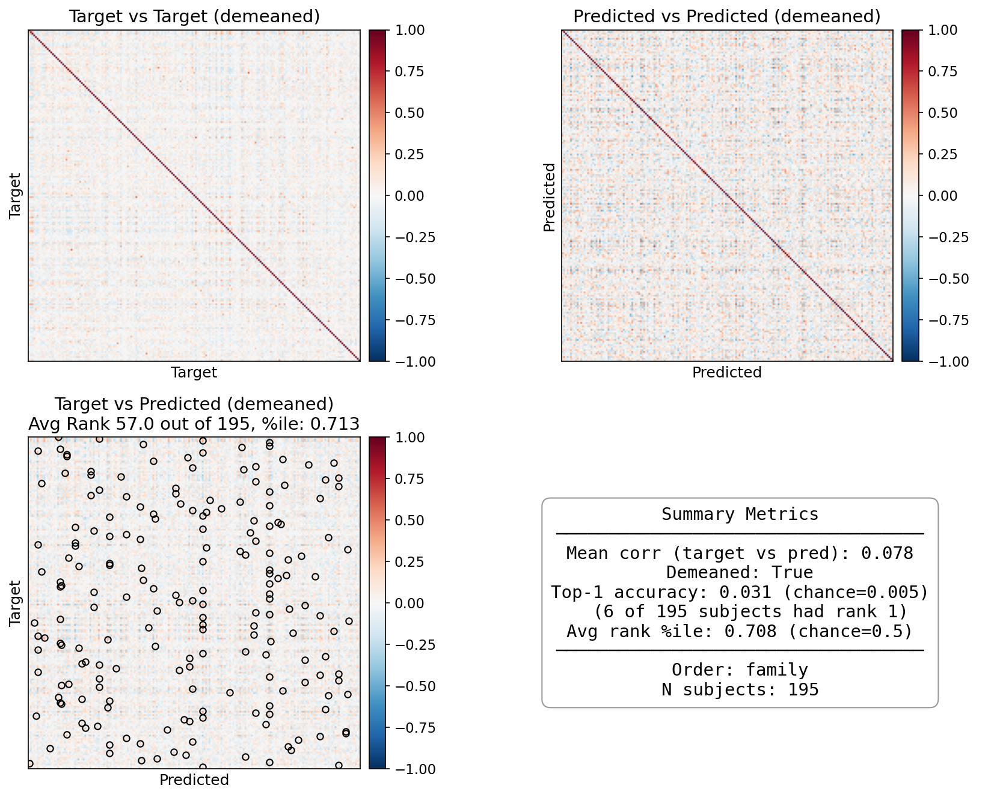

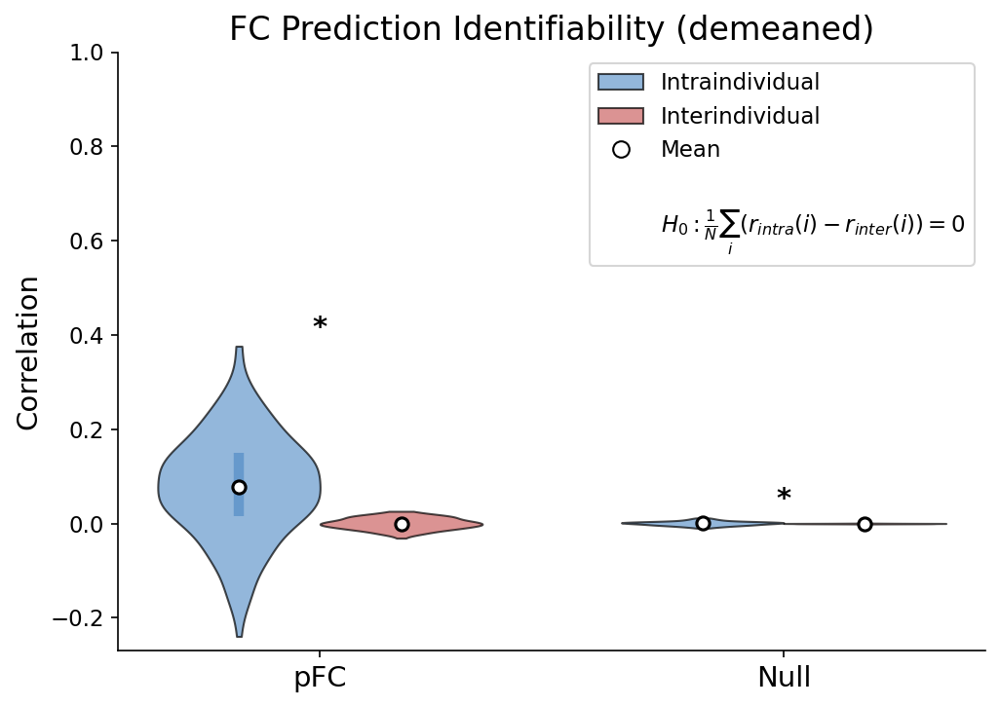


Identifiability Summary:
Condition    r_intra    r_inter    d          t          p            Cohen d   
----------------------------------------------------------------------
pFC          0.0779     0.0000     0.0778     9.86       7.63e-19     0.71      
Null         0.0006     -0.0001    0.0007     2.24       2.62e-02     0.16      


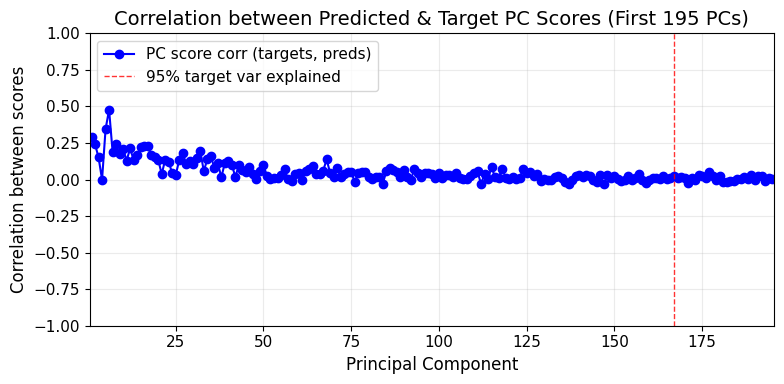

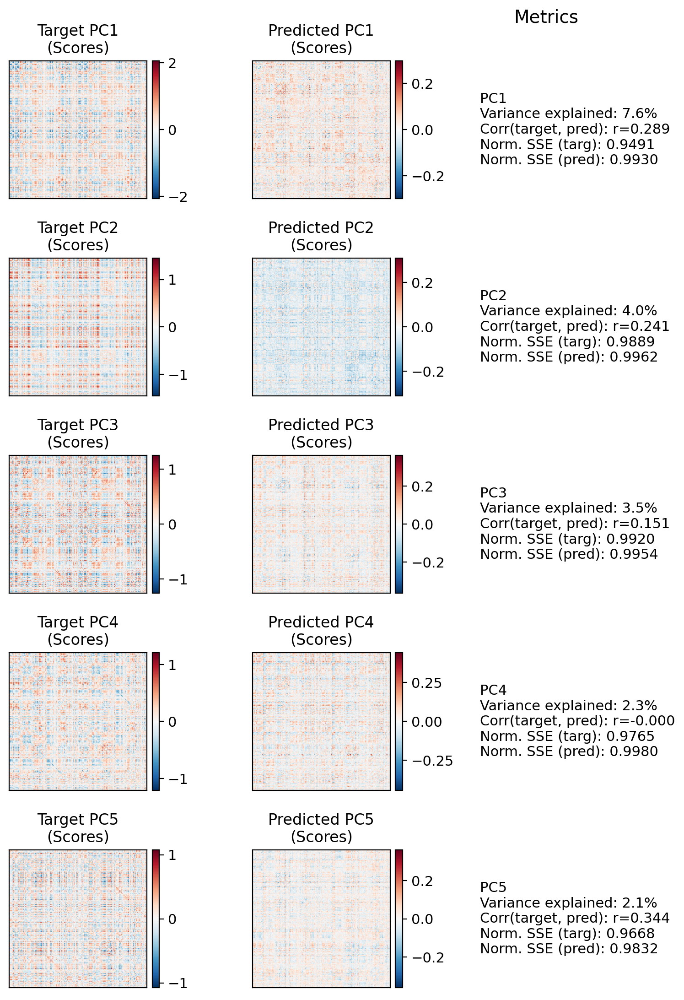

{'partition': 'test',
 'n_subjects': 195,
 'base_metrics': {'mse': np.float32(0.014554881),
  'r2': np.float32(-0.106562875),
  'pearson': np.float32(0.82372665),
  'demeaned_pearson': np.float64(0.0778922596685493),
  'avg_rank': np.float64(0.7087968441814596),
  'top1_acc': np.float64(0.046153846153846156)},
 'heatmaps_demeaned': {'mean_corr': np.float64(0.07789225966854932),
  'demeaned': True,
  'top1_acc': np.float64(0.03076923076923077),
  'avg_rank_percentile': np.float64(0.7078763971071664),
  'chance_top1': 0.005128205128205128,
  'chance_avgrank': 0.5,
  'ranklist': [73,
   7,
   124,
   13,
   44,
   170,
   10,
   127,
   13,
   11,
   36,
   118,
   4,
   67,
   79,
   12,
   43,
   73,
   14,
   12,
   7,
   1,
   4,
   5,
   53,
   54,
   70,
   25,
   181,
   48,
   35,
   149,
   79,
   177,
   27,
   49,
   137,
   93,
   3,
   178,
   55,
   140,
   2,
   20,
   4,
   73,
   14,
   1,
   95,
   84,
   149,
   8,
   33,
   18,
   188,
   2,
   4,
   1,
   113,
   37,


In [64]:
test_evaluator.analyze_results(verbose=False) #, filepath='/scratch/asr655/neuroinformatics/Conn2Conn/results/cross_PC_results.jpg')

### Cross-modal (SC-to-FC) PCA + PLS Fusion Learnable model

In [4]:
HCP_Dataset = HCP_Base(parcellation="Glasser", shuffle_seed=0, source="SC", target="FC")

# redefine dataset and loaders
HCP_train = HCP_Partition(HCP_Dataset, "train")
HCP_val = HCP_Partition(HCP_Dataset, "val")
HCP_test = HCP_Partition(HCP_Dataset, "test")
HCP_train_loader = DataLoader(HCP_train, batch_size=64, shuffle=True)
HCP_val_loader = DataLoader(HCP_val, batch_size=64, shuffle=True)
HCP_test_loader = DataLoader(HCP_test, batch_size=64, shuffle=True)

In [ ]:
# initialize model
cross_modal_pca_pls_learnable_model = CrossModal_PCA_PLS_learnable(HCP_Dataset,
                                        n_components_pca_source=256, n_components_pls=4, n_components_pca_target=256, 
                                        learn_encoder=False, learn_mid=True, learn_decoder=False,
                                        loss_fn='demeaned_mse') #, loss_alpha=0.5)

/ext3/miniforge3/lib/python3.12/site-packages/sklearn/cross_decomposition/_pls.py:104: ConvergenceWarning: Maximum number of iterations reached
  warnings.warn("Maximum number of iterations reached", ConvergenceWarning)


PLS fit score: 0.0295
W_enc shape: (64620, 256)
W_mid shape: (256, 256)
W_dec shape: (256, 64620)


Training on cuda
Model parameters: 65,536
Loss: demeaned_mse
Epochs: 200, LR: 5e-05, Weight Decay: 0.0001
Logging every 5 epochs

Epoch    1 | Train MSE: 0.011824, r: 0.8588, r_dm: 0.4201 | Val MSE: 0.014386, r: 0.8304, r_dm: 0.1013 | 0.03s | GPU: 2047MB


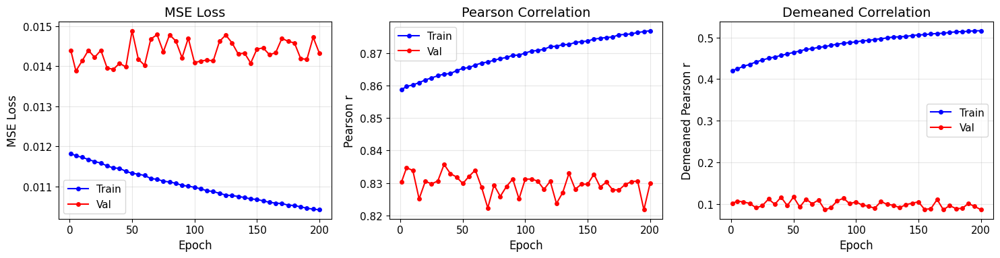

Epoch    5 | Train MSE: 0.011761, r: 0.8597, r_dm: 0.4247 | Val MSE: 0.013883, r: 0.8347, r_dm: 0.1069 | 0.03s | GPU: 2047MB
Epoch   10 | Train MSE: 0.011728, r: 0.8602, r_dm: 0.4306 | Val MSE: 0.014136, r: 0.8338, r_dm: 0.1050 | 0.03s | GPU: 2047MB
Epoch   15 | Train MSE: 0.011670, r: 0.8609, r_dm: 0.4352 | Val MSE: 0.014400, r: 0.8251, r_dm: 0.1012 | 0.03s | GPU: 2047MB
Epoch   20 | Train MSE: 0.011621, r: 0.8617, r_dm: 0.4412 | Val MSE: 0.014224, r: 0.8306, r_dm: 0.0909 | 0.03s | GPU: 2047MB
Epoch   25 | Train MSE: 0.011581, r: 0.8623, r_dm: 0.4456 | Val MSE: 0.014400, r: 0.8297, r_dm: 0.0959 | 0.03s | GPU: 2047MB
Epoch   30 | Train MSE: 0.011512, r: 0.8630, r_dm: 0.4500 | Val MSE: 0.013957, r: 0.8306, r_dm: 0.1121 | 0.03s | GPU: 2047MB
Epoch   35 | Train MSE: 0.011460, r: 0.8635, r_dm: 0.4529 | Val MSE: 0.013925, r: 0.8357, r_dm: 0.0994 | 0.03s | GPU: 2047MB
Epoch   40 | Train MSE: 0.011450, r: 0.8637, r_dm: 0.4565 | Val MSE: 0.014076, r: 0.8329, r_dm: 0.1163 | 0.03s | GPU: 2047MB


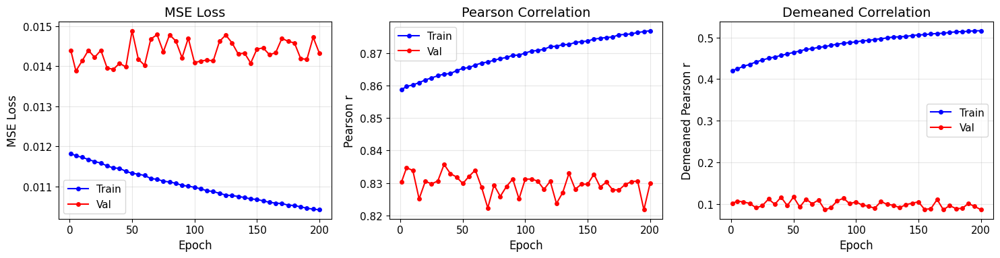

In [52]:
logger = train_model(
    cross_modal_pca_pls_learnable_model,
    HCP_train_loader,
    HCP_val_loader,
    base=HCP_Dataset,
    num_epochs=200,
    lr=.00005,
    weight_decay=0.0001, # Standard L2 regularization
    log_every=5
)

Pure PLS

In [ ]:
# initialize model
cross_modal_pls_svd = CrossModal_PLS_SVD(HCP_Dataset, n_components=400)

Fitting PLS-SVD (implicit): X shape (683, 64620), Y shape (683, 64620)
n_components: 400
Memory-efficient: NOT forming 64620x64620 cross-covariance matrix
Computing top-400 singular vectors via implicit SVD...


In [ ]:
# generate predictions
device = cross_modal_pls_svd.device if hasattr(cross_modal_pls_svd, 'device') else torch.device("cpu")
train_preds, train_targets = predict_from_loader(cross_modal_pls_svd, HCP_train_loader, device=device)
val_preds, val_targets = predict_from_loader(cross_modal_pls_svd, HCP_val_loader, device=device)
test_preds, test_targets = predict_from_loader(cross_modal_pls_svd, HCP_test_loader, device=device)

In [ ]:
train_evaluator = Evaluator(train_preds, train_targets, HCP_train, HCP_Dataset)
val_evaluator = Evaluator(val_preds, val_targets, HCP_val, HCP_Dataset)
test_evaluator = Evaluator(test_preds, test_targets, HCP_test, HCP_Dataset)

Top-1 accuracy: 0.046  (9 of 195 subjects had rank 1) (chance=0.005)
Average rank percentile: 0.706 (chance=0.5)


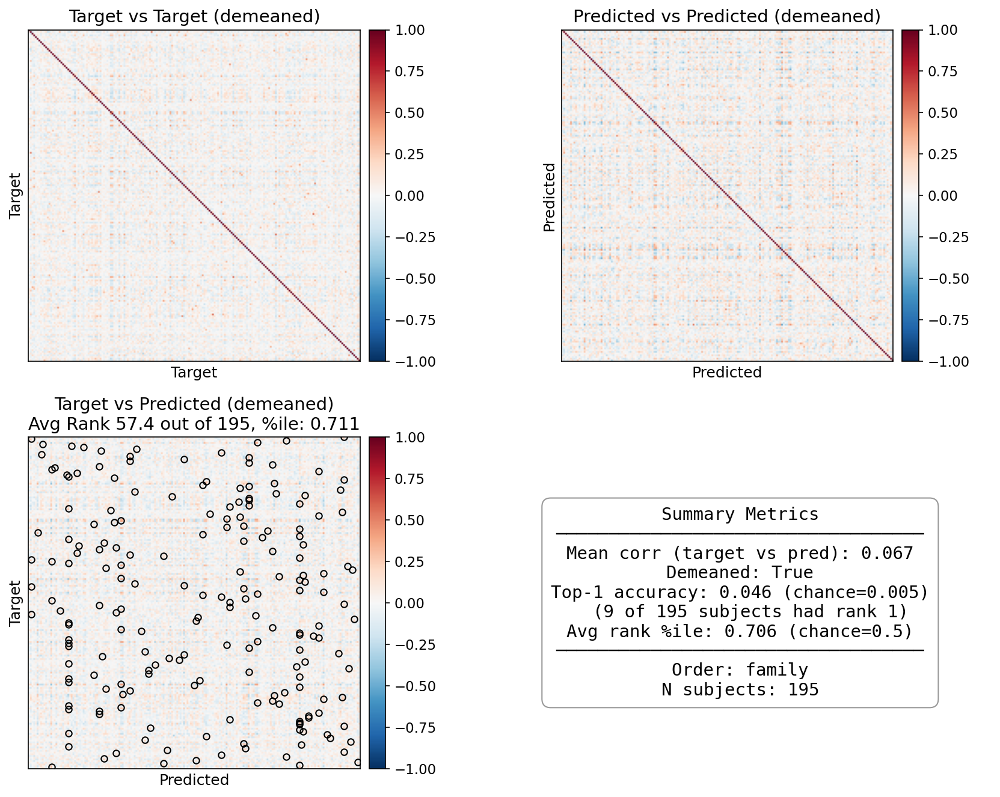

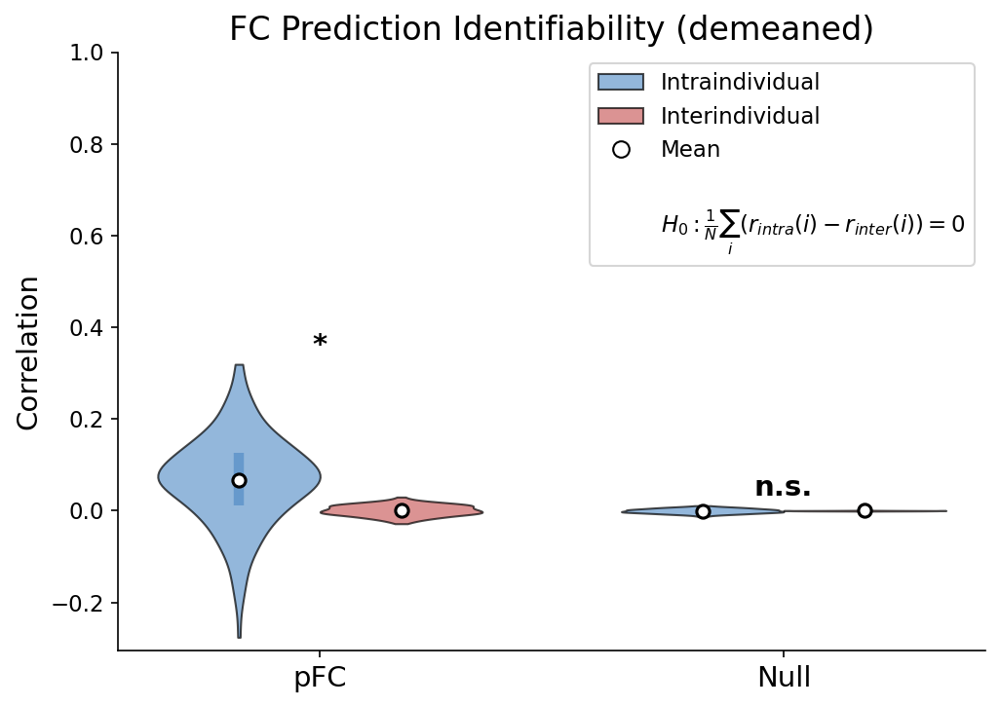


Identifiability Summary:
Condition    r_intra    r_inter    d          t          p            Cohen d   
----------------------------------------------------------------------
pFC          0.0666     0.0009     0.0657     9.33       2.43e-17     0.67      
Null         -0.0003    -0.0001    -0.0002    -0.56      5.79e-01     -0.04     


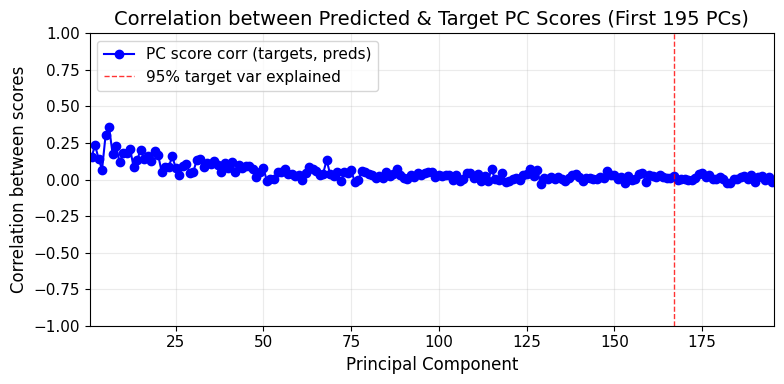

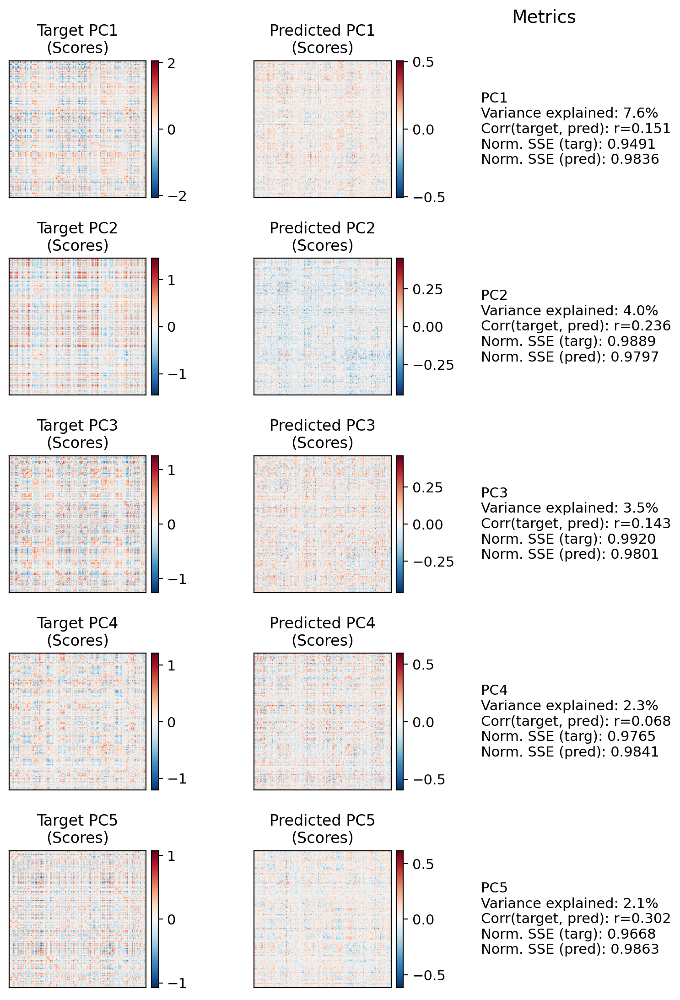

{'partition': 'test',
 'n_subjects': 195,
 'base_metrics': {'mse': np.float32(0.018728407),
  'r2': np.float32(-0.43377587),
  'pearson': np.float32(0.7768415),
  'demeaned_pearson': np.float64(0.0665839819245775),
  'avg_rank': np.float64(0.6665088757396449),
  'top1_acc': np.float64(0.03076923076923077)},
 'heatmaps_demeaned': {'mean_corr': np.float64(0.0665839819245775),
  'demeaned': True,
  'top1_acc': np.float64(0.046153846153846156),
  'avg_rank_percentile': np.float64(0.7056673241288626),
  'chance_top1': 0.005128205128205128,
  'chance_avgrank': 0.5,
  'ranklist': [69,
   1,
   16,
   80,
   7,
   10,
   28,
   29,
   37,
   7,
   162,
   41,
   46,
   185,
   14,
   83,
   7,
   29,
   54,
   8,
   6,
   49,
   1,
   1,
   19,
   23,
   46,
   28,
   21,
   77,
   169,
   81,
   10,
   48,
   22,
   11,
   81,
   28,
   93,
   173,
   170,
   183,
   50,
   14,
   35,
   39,
   5,
   108,
   90,
   79,
   1,
   68,
   30,
   176,
   154,
   62,
   102,
   78,
   43,
   3,
   

In [ ]:
test_evaluator.analyze_results(verbose=False)

### Testing for purely learned linear model with same dims as PCA/PLS

In [87]:
# Redefine dataset and loaders
HCP_train = HCP_Partition(HCP_Dataset, "train")
HCP_val = HCP_Partition(HCP_Dataset, "val")
HCP_test = HCP_Partition(HCP_Dataset, "test")
HCP_train_loader = DataLoader(HCP_train, batch_size=64, shuffle=True)
HCP_val_loader = DataLoader(HCP_val, batch_size=64, shuffle=True)
HCP_test_loader = DataLoader(HCP_test, batch_size=64, shuffle=True)


In [99]:
# Initialize model
cross_modal_pca_pls_learnable_model = CrossModal_PCA_PLS_learnable(HCP_Dataset,
                                        n_components_pca_source=128, n_components_pls=64, n_components_pca_target=128,
                                        learn_encoder=False, learn_mid=False, learn_decoder=True,
                                        loss_fn='demeaned_mse', # loss_alpha=0.5,
                                        random_init=True,
                                        dropout=0.1, l1_reg=0.0001, l2_reg=0.0,
                                        epochs=100, lr=.00001)

/ext3/miniforge3/lib/python3.12/site-packages/sklearn/cross_decomposition/_pls.py:104: ConvergenceWarning: Maximum number of iterations reached
  warnings.warn("Maximum number of iterations reached", ConvergenceWarning)


Init: enc:pca/pls(frozen), mid:pca/pls(frozen), dec:rand
Shapes: enc=(64620, 128), mid=(128, 128), dec=(128, 64620)


Training on cuda
Model parameters: 8,271,360
Loss: demeaned_mse | Reg: L1=0.0001, L2=0.0
Epochs: 100, LR: 1e-05
Logging every 5 epochs

Epoch    1 | Train MSE: 0.014303, r: 0.8264, r_dm: 0.0005 | Val MSE: 0.014346, r: 0.8296, r_dm: 0.0002 | 0.05s | GPU: 1623MB


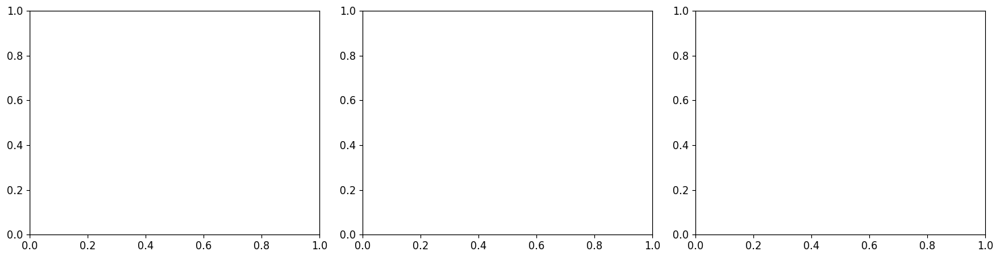

Epoch    5 | Train MSE: 0.014113, r: 0.8286, r_dm: 0.0005 | Val MSE: 0.015103, r: 0.8256, r_dm: 0.0005 | 0.05s | GPU: 1623MB
Epoch   10 | Train MSE: 0.013954, r: 0.8308, r_dm: 0.0005 | Val MSE: 0.014260, r: 0.8312, r_dm: 0.0011 | 0.05s | GPU: 1623MB
Epoch   15 | Train MSE: 0.013817, r: 0.8325, r_dm: 0.0006 | Val MSE: 0.014159, r: 0.8275, r_dm: 0.0011 | 0.04s | GPU: 1623MB
Epoch   20 | Train MSE: 0.013772, r: 0.8332, r_dm: 0.0007 | Val MSE: 0.014231, r: 0.8329, r_dm: 0.0013 | 0.05s | GPU: 1623MB
Epoch   25 | Train MSE: 0.013710, r: 0.8339, r_dm: 0.0007 | Val MSE: 0.013902, r: 0.8353, r_dm: 0.0006 | 0.04s | GPU: 1623MB
Epoch   30 | Train MSE: 0.013710, r: 0.8343, r_dm: 0.0006 | Val MSE: 0.014576, r: 0.8318, r_dm: 0.0005 | 0.05s | GPU: 1623MB
Epoch   35 | Train MSE: 0.013710, r: 0.8342, r_dm: 0.0015 | Val MSE: 0.014551, r: 0.8283, r_dm: 0.0006 | 0.05s | GPU: 1623MB
Epoch   40 | Train MSE: 0.013732, r: 0.8338, r_dm: 0.0021 | Val MSE: 0.014487, r: 0.8287, r_dm: -0.0002 | 0.05s | GPU: 1623MB

In [ ]:
# Training just needs data - all config comes from the model
logger = train_model(cross_modal_pca_pls_learnable_model, HCP_train_loader, HCP_val_loader, HCP_Dataset)